In [1]:
from mindspore import nn, ops, Tensor, jit_class, set_context, set_seed, jacrev
import mindspore as ms
import numpy as np

set_seed(123456)

In [2]:
set_context(mode=ms.PYNATIVE_MODE, device_target="GPU")

In [3]:
from mindspore.common.initializer import Normal

class Network(nn.Cell):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Dense(1, 32, Normal())
        self.fc2 = nn.Dense(32, 32, Normal())
        self.fc3 = nn.Dense(32, 32, Normal())
        self.fc4 = nn.Dense(32, 32, Normal())
        self.fc5 = nn.Dense(32, 32, Normal())
        self.fcout = nn.Dense(32, 1, Normal())
        self.act = ops.Tanh()

    def construct(self, x):
        x = self.act(self.fc1(x))
        x = self.act(self.fc2(x))
        x = self.act(self.fc3(x))
        x = self.act(self.fc4(x))
        x = self.act(self.fc5(x))
        x = self.fcout(x)

        return x

model = Network()
model

Network<
  (fc1): Dense<input_channels=1, output_channels=32, has_bias=True>
  (fc2): Dense<input_channels=32, output_channels=32, has_bias=True>
  (fc3): Dense<input_channels=32, output_channels=32, has_bias=True>
  (fc4): Dense<input_channels=32, output_channels=32, has_bias=True>
  (fc5): Dense<input_channels=32, output_channels=32, has_bias=True>
  (fcout): Dense<input_channels=32, output_channels=1, has_bias=True>
  >

In [4]:
samples = 2**15

class MyIterable:
    def __init__(self):
        
        self._index = 0
        self._data = np.random.uniform(-np.pi, np.pi, size=(samples, 1)).astype(np.float32)
        self._ic = np.zeros((samples, 1)).astype(np.float32)

    def __next__(self):
        if self._index >= len(self._data):
            raise StopIteration
        else:
            item = (self._data[self._index], self._ic[self._index])
            self._index += 1
            return item
        
    def __iter__(self):
        self._index = 0
        return self
    
    def __len__(self):
        return len(self._data)
    
dataset = ms.dataset.GeneratorDataset(source=MyIterable(), column_names=["data", "label"])
print(dataset)

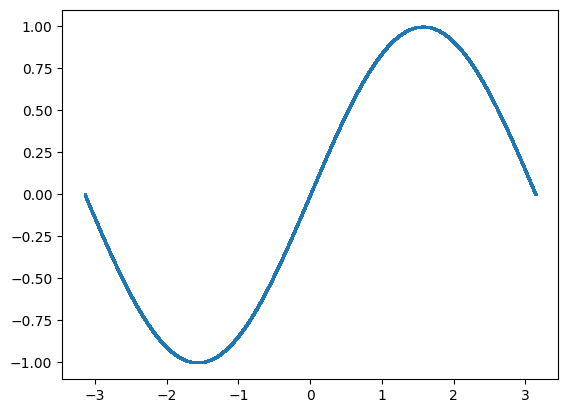

In [5]:
from matplotlib import pyplot as plt
test_data = np.random.uniform(-np.pi, np.pi, size=(2**17, 1)).astype(np.float32)
test_label = np.sin(test_data)
plt.scatter(test_data, test_label, s=1)
plt.show()

In [6]:
import sympy


class SimplyGradient(nn.Cell):
    def __init__(self, net, order):
        super().__init__()
        self.net = net
        self.order = order - 1

    def construct(self, x):
        return self.net(x).sum(axis=self.order)

@jit_class
class MyLossFun:
    def __init__(self, net):
        self.net = net
        self.reduce_mean = ops.ReduceMean()
        self.loss_fn = nn.MSELoss()
        self.concat = ops.Concat(1)
        self.first_grad = SimplyGradient(jacrev(self.net), 1)

    def compute_loss(self, pde_data, ic_data):
        pde_loss = self.reduce_mean(self.loss_fn(self.pde(pde_data), Tensor(np.array([0.0]).astype(np.float32), ms.float32)))
        ic_loss = self.reduce_mean(self.loss_fn(self.ic(ic_data), Tensor(np.array([0.0]).astype(np.float32), ms.float32)))

        return pde_loss + ic_loss

    def ic(self, data):
        out = self.net(data)
        return out

    def pde(self, data):
        x = sympy.Symbol("x")
        y = sympy.Function('y')(x)

        formula = y.diff(x)

        rst = 0.0
        # number of items seperated by add
        if formula.is_Add:
            # parser each item
            for item in formula.args:
                rst += self._compute_formula_item(item, data)
        else:
            rst += self._compute_formula_item(formula, data)
        jac = self.first_grad(data)[0]
        tmp = self.concat((rst, ops.cos(data), jac))
        print(tmp)
        return rst

    def compute_outs(self, data):
        self.outs = self.net(data)

    def _compute_formula_item(self, item, data):

        rst = 1.0  # TODO: float / double / float16

        if item.is_Mul:
            for it in item.args:
                rst = rst * self._compute_formula_item(it, data)
        elif item.is_Number:
            # print("*** number:", item)
            rst = float(item) * rst  # TODO: float / double / float16
        elif item.is_Symbol:
            # print("*** symbol:", item)
            rst = rst * self._compute_formula_symbol(item, data)
        elif item.is_Function:
            # print("*** function:", item)
            rst = rst * self._compute_formula_function(item, data)
        elif item.is_Derivative:
            # print("*** der:", item)
            rst = rst * self._compute_formula_der(item, data)
        else:
            pass

        return rst

    def _compute_formula_symbol(self, item, data):
        return data[:, 0]  # TODO

    def _compute_formula_function(self, item, data):
        return self.net(data)

    def _compute_formula_der(self, item, data):
        data = Tensor(data, ms.float32)

        # derivative order
        order = 0
        for it in item.args[1:]:
            order += it[1]

        if order == 1:
            v = item.args[1][0]
            first_grad = ops.grad(self.net)
            rst = first_grad(data)
            return rst

        else:
            
            rst = self.net(data)

            return rst 


In [7]:
optimizer = nn.Adam(model.trainable_params(), learning_rate=5e-3)
loss_fn = MyLossFun(model)

In [8]:
batch_size=2**5
dataset = dataset.batch(batch_size=batch_size)

In [9]:
def train_loop(model, dataset, loss_fn, optimizer):
    def forwad_fn(pde_data, ic_data):
        # logits = model(pde_data)
        loss = loss_fn.compute_loss(pde_data, ic_data)
        return loss
    
    grad_fn = ops.value_and_grad(forwad_fn, None, optimizer.parameters, has_aux=False)
    
    def train_step(pde_data, ic_data):
        loss, grads = grad_fn(pde_data, ic_data)
        loss = ops.depend(loss, optimizer(grads))
        return loss
    
    size = dataset.get_dataset_size()
    print(size)
    model.set_train()
    for batch, (pde_data, ic_data) in enumerate(dataset.create_tuple_iterator()):
        # print(data.shape, "  ", label.shape)
        loss = train_step(pde_data, ic_data)

        if batch % 100 == 0:
            loss, current = loss.asnumpy(), batch
            print(f"loss: {loss:>7f}  [{current:>3d}/{size:>3d}]")
        

In [10]:
def test_loop(model, dataset, loss_fn):
    num_batches = dataset.get_dataset_size()
    model.set_train(False)
    total, test_loss, correct = 0, 0, 0
    for pde_data, ic_data in dataset.create_tuple_iterator():
        total += 2*len(pde_data)
        pred_pde = model(pde_data)
        pred_ic = model(ic_data)
        test_loss += loss_fn.compute_loss(pde_data, ic_data).asnumpy()
        correct += (ops.isclose(pred_pde, ops.sin(pde_data), rtol=1e-2, atol=1e-8)).asnumpy().sum()
        correct += (ops.isclose(pred_ic, ops.sin(ic_data), rtol=1e-2, atol=1e-8)).asnumpy().sum()
    test_loss /= num_batches
    correct /= total
    print(f"Test: \n Accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")

In [11]:
import time
for epoch in range(5):
    print("epoch: ", epoch + 1)
    time_beg = time.time()
    train_loop(model, dataset, loss_fn, optimizer)
    time_cost = time.time()-time_beg
    mean_step_cost = time_cost * batch_size / samples * 1000 
    print(f"Train: \n time cost: {time_cost:>4f}s\nmean step time cost: {mean_step_cost:>5f}ms" )
    test_loop(model, dataset, loss_fn)
    print("="*100)

epoch:  1
1024
[[-3.8121701e-09  9.5369351e-01 -3.8121701e-09]
 [-3.8085650e-09 -5.3717941e-01 -3.8085650e-09]
 [-3.8077297e-09 -7.1548820e-01 -3.8077297e-09]
 [-3.8121866e-09  9.6367973e-01 -3.8121870e-09]
 [-3.8117327e-09  6.9822037e-01 -3.8117327e-09]
 [-3.8121590e-09  9.4709188e-01 -3.8121586e-09]
 [-3.8078802e-09 -6.8710470e-01 -3.8078793e-09]
 [-3.8081280e-09 -6.3683671e-01 -3.8081285e-09]
 [-3.8089816e-09 -4.2798585e-01 -3.8089811e-09]
 [-3.8115493e-09  5.9817457e-01 -3.8115493e-09]
 [-3.8099084e-09 -1.3226622e-01 -3.8099088e-09]
 [-3.8098098e-09 -1.6749412e-01 -3.8098094e-09]
 [-3.8119601e-09  8.2784414e-01 -3.8119610e-09]
 [-3.8080694e-09 -6.4919221e-01 -3.8080699e-09]
 [-3.8082866e-09 -6.0242712e-01 -3.8082861e-09]
 [-3.8100207e-09 -9.0933464e-02 -3.8100203e-09]
 [-3.8082670e-09 -6.0679603e-01 -3.8082666e-09]
 [-3.8119894e-09  8.4476942e-01 -3.8119894e-09]
 [-3.8120715e-09  8.9380825e-01 -3.8120711e-09]
 [-3.8061287e-09 -9.2680949e-01 -3.8061287e-09]
 [-3.8119858e-09  8.42890

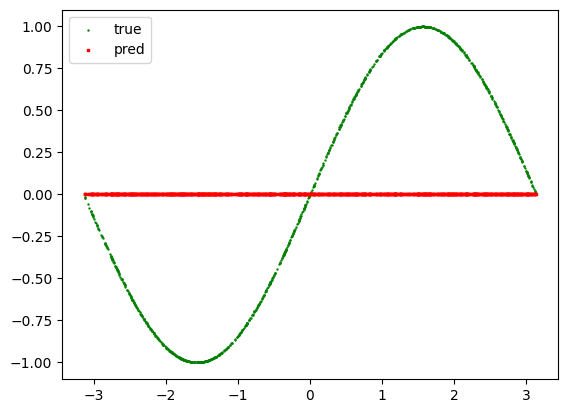

In [12]:
valid_data = np.random.uniform(-np.pi, np.pi, size=(1000, 1))
true_label = np.sin(valid_data)
pred_label = model(Tensor(valid_data, ms.float32))
plt.scatter(valid_data, true_label, color="green", s=2, marker=".")
plt.scatter(valid_data, pred_label, color="red", s=2, marker="s")
plt.legend(["true", "pred"])
plt.show()

In [13]:
from mindspore import ops, Tensor
import mindspore as ms
import numpy as np

fn = ops.grad(ops.sin)
fn(Tensor(np.array([0.0, np.pi/2.0]).astype(np.float32), ms.float32))

Tensor(shape=[2], dtype=Float32, value= [ 1.00000000e+00, -4.37113883e-08])